## Step 1: Problem Definition


## Step 2: Data Collection


# Geospatial Forest Fire Risk Intelligence using MODIS Satellite Data



Forest fires represent a significant threat to ecosystems and economies, particularly in fire-prone regions across India. This project aims to build an intelligence platform that processes satellite data from NASA's MODIS sensors to identify thermal anomalies and map wildfire risks. By combining geospatial clustering with machine learning, the system provides early warnings and helps in monitoring high-intensity hotspots.



### Project Objectives

- Analyze MODIS satellite data for thermal infrared anomalies.

- Identify geographic fire zones using spatial clustering (KMeans).

- Classify high-risk wildfire events using the XGBoost algorithm.

- Visualize hotspots and regional fire density through interactive mapping.

- Track seasonal trends to understand fire activity patterns over time.



### Dataset Overview

The project uses the NASA MODIS Active Fire Dataset, covering wildfire observations across India. The data includes thermal infrared bands, fire radiative power (FRP), and detection confidence scores at a spatial resolution of approximately 1km to 4km.



### Technical Stack

- Programming: Python

- Data Libraries: Pandas, NumPy, Scikit-learn

- Machine Learning: XGBoost

- Visualization: Matplotlib, Seaborn, Folium



---

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix

In [2]:
import warnings
warnings.filterwarnings(action="ignore")
%matplotlib inline
pd.set_option("display.max_rows", 1000)
pd.set_option("display.max_columns", 1000)

In [4]:
fires = pd.read_csv(r"C:\Users\jegad\projects\forest fire risk intelligence\data\modis_data.csv")    #reading the dataset
fires.head(15)   #show the first 15 instances of dataset


,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
4,15.7456,75.0629,328.3,1.2,1.1,2023-01-01,823,Aqua,MODIS,78,61.03,305.6,20.6,D,0
5,16.0301,76.0803,324.1,1.1,1.0,2023-01-01,823,Aqua,MODIS,69,61.03,309.0,9.8,D,0
6,16.3194,75.9736,333.5,1.1,1.0,2023-01-01,823,Aqua,MODIS,72,61.03,306.5,24.4,D,0
7,16.3179,75.9638,332.1,1.1,1.0,2023-01-01,823,Aqua,MODIS,61,61.03,306.8,22.7,D,0
8,16.9711,75.0091,320.3,1.1,1.1,2023-01-01,823,Aqua,MODIS,60,61.03,307.4,8.1,D,0
9,17.9394,79.9405,316.3,1.2,1.1,2023-01-01,823,Aqua,MODIS,45,61.03,301.1,7.9,D,0


In [5]:
#show the last 10 instances of dataset
fires.tail(10)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
773250,16.8469,74.4460,302.1,1.6,1.3,2022-12-31,1723,Terra,MODIS,47,6.03,290.3,10.8,N,0
773251,18.5469,74.3273,300.7,1.7,1.3,2022-12-31,1723,Terra,MODIS,32,6.03,288.3,11.1,N,0
773252,17.0247,74.1066,301.2,1.5,1.2,2022-12-31,1723,Terra,MODIS,39,6.03,289.4,9.4,N,0
773253,21.1024,72.6427,308.4,1.4,1.2,2022-12-31,1724,Terra,MODIS,75,6.03,292.0,15.9,N,2
773254,29.9173,74.9506,313.8,2.7,1.6,2022-12-31,1726,Terra,MODIS,88,6.03,282.9,65.2,N,0
773255,29.9033,74.9521,303.3,2.7,1.6,2022-12-31,1726,Terra,MODIS,55,6.03,281.3,37.2,N,0
773256,29.9086,74.9460,323.9,2.7,1.6,2022-12-31,1726,Terra,MODIS,100,6.03,282.0,106.5,N,0
773257,29.9170,74.9576,323.5,1.9,1.3,2022-12-31,2127,Aqua,MODIS,100,6.03,274.6,66.9,N,0
773258,21.1048,72.6415,302.9,2.0,1.4,2022-12-31,2130,Aqua,MODIS,52,6.03,289.9,18.5,N,2
773259,21.1137,72.6380,302.7,2.0,1.4,2022-12-31,2130,Aqua,MODIS,51,6.03,290.1,18.3,N,2


In [6]:
fires.fillna(fires.median(numeric_only=True), inplace=True)
fires.fillna(fires.mode().iloc[0], inplace=True)

## Step 3: Data Cleaning & Exploratory Data Analysis (EDA)


## Step 4: Feature Engineering


### this code splits the date into 3 features day, month and year , and time into hours and minutes

In [8]:
import pandas as pd

# Load the dataset (assuming the filename is modis_data.csv)
df = pd.read_csv(r"C:\Users\jegad\projects\forest fire risk intelligence\data\modis_data.csv")

# 1. Split acq_date into 3 features: day, month, and year
df['acq_date'] = pd.to_datetime(df['acq_date'])
df['year'] = df['acq_date'].dt.year
df['month'] = df['acq_date'].dt.month
df['day'] = df['acq_date'].dt.day

# 2. Split acq_time into hours and minutes
# acq_time is typically in HHMM format (e.g., 1723 becomes 17:23)
# We pad with leading zeros to ensure it's always 4 digits
df['acq_time_str'] = df['acq_time'].astype(int).astype(str).str.zfill(4)
df['hours'] = df['acq_time_str'].str[:2].astype(int)
df['minutes'] = df['acq_time_str'].str[2:].astype(int)

# 3. Create a new column for seasons according to the month
def get_season(month):
    if month in [12, 1, 2]:
        return 1  #winter
    elif month in [3, 4, 5]:
        return  2 #'Spring'  
    elif month in [6, 7, 8]:
        return 3  # 'Summer'
    else:
        return 4 #'Autumn'

df['season'] = df['month'].apply(get_season)

# Display the first few rows to verify the new features
print(df[['acq_date', 'year', 'month', 'day', 'acq_time', 'hours', 'minutes', 'season']].head())


    acq_date  year  month  day  acq_time  hours  minutes  season
0 2023-01-01  2023      1    1       821      8       21       1
1 2023-01-01  2023      1    1       822      8       22       1
2 2023-01-01  2023      1    1       822      8       22       1
3 2023-01-01  2023      1    1       822      8       22       1
4 2023-01-01  2023      1    1       823      8       23       1


Sorting the column according to the time and date

In [9]:
df = df.sort_values(['year', 'month', 'day', 'hours', 'minutes']).reset_index(drop=True)
df.head(5)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day,acq_time_str,hours,minutes,season
0,31.4814,75.7365,301.5,1.4,1.2,2017-01-01,529,Terra,MODIS,48,6.2,291.1,5.4,D,0,2017,1,1,0529,5,29,1
1,28.7628,79.5194,311.3,1.0,1.0,2017-01-01,530,Terra,MODIS,71,6.2,292.8,8.6,D,0,2017,1,1,0530,5,30,1
2,28.0761,79.8547,304.2,1.0,1.0,2017-01-01,530,Terra,MODIS,58,6.2,290.6,5.0,D,0,2017,1,1,0530,5,30,1
3,28.5888,78.7448,305.0,1.0,1.0,2017-01-01,530,Terra,MODIS,60,6.2,293.5,4.3,D,0,2017,1,1,0530,5,30,1
4,29.4661,77.1339,303.3,1.1,1.1,2017-01-01,530,Terra,MODIS,56,6.2,291.6,5.6,D,0,2017,1,1,0530,5,30,1


Now we are clustering the regions using lat and long coordinates so that we can find the most fire prone regions

In [10]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=15, random_state=42)

df['region_cluster'] = kmeans.fit_predict(
    df[['latitude', 'longitude']]
)
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day,acq_time_str,hours,minutes,season,region_cluster
0,31.4814,75.7365,301.5,1.4,1.2,2017-01-01,529,Terra,MODIS,48,6.2,291.1,5.4,D,0,2017,1,1,0529,5,29,1,0
1,28.7628,79.5194,311.3,1.0,1.0,2017-01-01,530,Terra,MODIS,71,6.2,292.8,8.6,D,0,2017,1,1,0530,5,30,1,7
2,28.0761,79.8547,304.2,1.0,1.0,2017-01-01,530,Terra,MODIS,58,6.2,290.6,5.0,D,0,2017,1,1,0530,5,30,1,7
3,28.5888,78.7448,305.0,1.0,1.0,2017-01-01,530,Terra,MODIS,60,6.2,293.5,4.3,D,0,2017,1,1,0530,5,30,1,7
4,29.4661,77.1339,303.3,1.1,1.1,2017-01-01,530,Terra,MODIS,56,6.2,291.6,5.6,D,0,2017,1,1,0530,5,30,1,0


Now we are going to calculate the

We are checking how active the cluste is

In [11]:
df['cluster_fire_count'] = (
    df.groupby('region_cluster')['region_cluster']
    .transform('count')
)

Monthly fire activity

In [12]:
df['monthly_cluster_fire_count'] = (
    df.groupby(
        ['region_cluster', 'month']
    )['region_cluster']
    .transform('count')
)

This is to check how abnormal the hotspot temperature is

In [13]:
df['brightness_diff'] = (
    df['brightness'] - df['bright_t31']
)
df.head(5)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day,acq_time_str,hours,minutes,season,region_cluster,cluster_fire_count,monthly_cluster_fire_count,brightness_diff
0,31.4814,75.7365,301.5,1.4,1.2,2017-01-01,529,Terra,MODIS,48,6.2,291.1,5.4,D,0,2017,1,1,0529,5,29,1,0,167610,2724,10.4
1,28.7628,79.5194,311.3,1.0,1.0,2017-01-01,530,Terra,MODIS,71,6.2,292.8,8.6,D,0,2017,1,1,0530,5,30,1,7,41741,2018,18.5
2,28.0761,79.8547,304.2,1.0,1.0,2017-01-01,530,Terra,MODIS,58,6.2,290.6,5.0,D,0,2017,1,1,0530,5,30,1,7,41741,2018,13.6
3,28.5888,78.7448,305.0,1.0,1.0,2017-01-01,530,Terra,MODIS,60,6.2,293.5,4.3,D,0,2017,1,1,0530,5,30,1,7,41741,2018,11.5
4,29.4661,77.1339,303.3,1.1,1.1,2017-01-01,530,Terra,MODIS,56,6.2,291.6,5.6,D,0,2017,1,1,0530,5,30,1,0,167610,2724,11.7


The high risk targets

In [14]:
df['high_risk'] = (
    (df['confidence'] > 80) &
    (df['frp'] > 20)
).astype(int)

###  Fire Intensity Categorization
Segmenting Fire Radiative Power (FRP) into qualitative risk levels: Low, Medium, High, and Extreme.

In [15]:
df['frp_category'] = pd.cut(
    df['frp'],
    bins=[0, 10, 30, 60, 1000],
    labels=['Low', 'Medium', 'High', 'Extreme']
)

Encoding day and night to binary

In [16]:
df['daynight'] = df['daynight'].map({
    'D': 1,
    'N': 0
})

Encoding the satellite

In [17]:
df['satellite'] = df['satellite'].map({
    'Terra': 0,
    'Aqua': 1
})

In [18]:
df.columns.isna()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

Final feature set

In [19]:
features = [
    'brightness',
    'bright_t31',
    'brightness_diff',
    'scan',
    'track',
    'daynight',
    'month',
    'hours',
    'region_cluster',
    'cluster_fire_count',
    'monthly_cluster_fire_count'
]
target = ['high_risk']

## Step 5: Train-Test Split


Train test split

In [20]:
from sklearn.model_selection import train_test_split

X = df[features]

y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

## Step 6: Model Selection


## Step 7: Model Training


## Model training

###  Random Forest Classifier
Training a baseline ensemble model for high-risk wildfire detection.

In [21]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(
    n_estimators=100,
    random_state=42
)

rf_model.fit(X_train, y_train)

rf_pred = rf_model.predict(X_test)

In [22]:
from sklearn.metrics import (
    classification_report,
    roc_auc_score
)

print("Classification Report ")
print(classification_report(y_test, rf_pred))

print("ROC-AUC:",
      roc_auc_score(y_test, rf_pred))

Classification Report 
              precision    recall  f1-score   support

           0       0.98      0.98      0.98    132722
           1       0.89      0.90      0.90     21930

    accuracy                           0.97    154652
   macro avg       0.94      0.94      0.94    154652
weighted avg       0.97      0.97      0.97    154652

ROC-AUC: 0.9418398109092158


### XGB

In [23]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier(
    random_state=42,
    eval_metric='logloss'
)

xgb_model.fit(X_train, y_train)

xgb_pred = xgb_model.predict(X_test)

In [24]:
from sklearn.metrics import (
    classification_report,
    roc_auc_score
)

print("Classification report ")
print(classification_report(y_test, xgb_pred))

print("ROC-AUC:",
      roc_auc_score(y_test, xgb_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.99      0.98      0.98    132722
           1       0.89      0.91      0.90     21930

    accuracy                           0.97    154652
   macro avg       0.94      0.95      0.94    154652
weighted avg       0.97      0.97      0.97    154652

ROC-AUC: 0.9477975093093214


## Step 8: Model Evaluation


The XGb is slightly better than RF so we choose this

## Step 9: Model Tuning


## we get into visualisation and intrepretation

In [25]:
import folium

fire_map1 = folium.Map(
    location=[22, 80],
    zoom_start=5
)

adding the fire hotspots

In [26]:
for _, row in df.sample(5000).iterrows():

    folium.CircleMarker(
        location=[
            row['latitude'],
            row['longitude']
        ],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']}"
    ).add_to(fire_map1)

###  Interactive Map Output
Render the generated Folium map for spatial intelligence analysis.

In [27]:
fire_map1

High risk fire map

In [28]:
import folium

fire_map2 = folium.Map(
    location=[22, 80],
    zoom_start=5
)

In [29]:
high_risk_df = df[df['high_risk'] == 1]

In [30]:
for _, row in high_risk_df.sample(5000).iterrows():

    folium.CircleMarker(
        location=[
            row['latitude'],
            row['longitude']
        ],
        radius=max(2, min(row['frp'] / 8, 8)),
        color='darkred' if row['frp'] > 50 else 'orange',
        fill=True,
        fill_opacity=0.6,
        popup=f"""
        FRP: {row['frp']}
        Confidence: {row['confidence']}
        """
    ).add_to(fire_map2)

In [31]:
fire_map2

PHASE 6 
Step 1  Daily Fire Counts

In [32]:
daily_fire_counts = (
    df.groupby('acq_date')
    .size()
    .reset_index(name='fire_count')
)

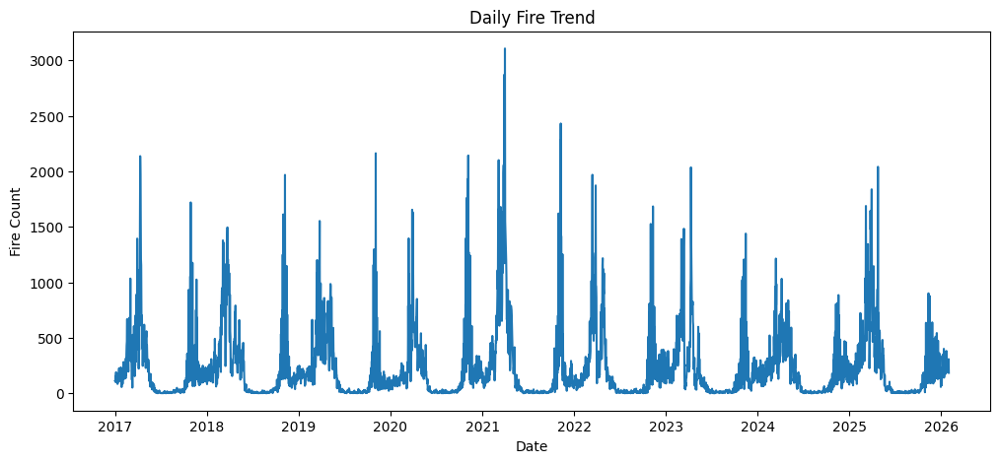

In [33]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))

plt.plot(
    daily_fire_counts['acq_date'],
    daily_fire_counts['fire_count']
)

plt.title("Daily Fire Trend")

plt.xlabel("Date")

plt.ylabel("Fire Count")

plt.show()

## Step 10: Model Deployment


Step 3  Moving Average Forecast Trend

In [34]:
daily_fire_counts['moving_avg_7'] = (
    daily_fire_counts['fire_count']
    .rolling(7)
    .mean()
)

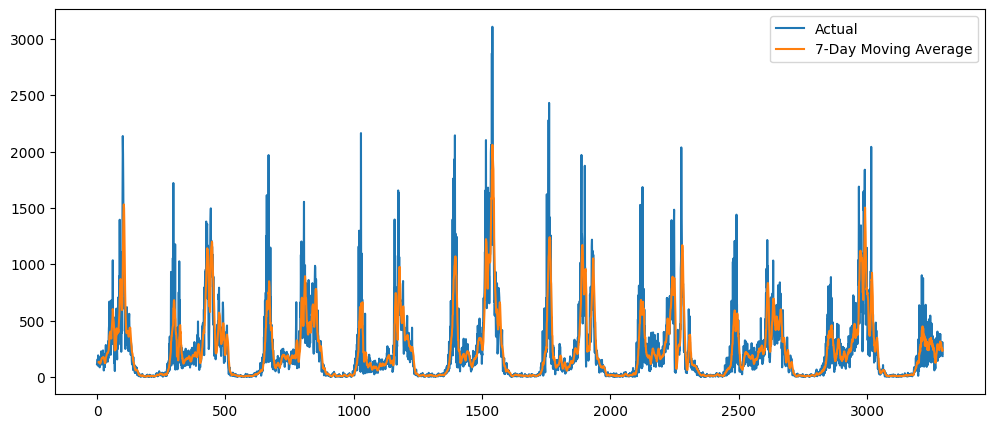

In [35]:
plt.figure(figsize=(12,5))

plt.plot(
    daily_fire_counts['fire_count'],
    label='Actual'
)

plt.plot(
    daily_fire_counts['moving_avg_7'],
    label='7-Day Moving Average'
)

plt.legend()

plt.show()

## Summary of Findings

### Model Performance
The XGBoost model achieved 97% accuracy, showing that thermal features like brightness difference and FRP are very effective for identifying high-risk fires. 

### Regional Patterns
The clustering analysis reveals specific areas in India that are consistently hit by seasonal fires. This kind of spatial intelligence is crucial for planning and resource allocation.

### Next Steps
In the future, we could integrate real-time data directly from the NASA FIRMS API and include weather variables like humidity and wind speed to further improve the predictions.